In [1]:
### automatically refresh the buffer
%load_ext autoreload
%autoreload 2

### solve the auto-complete issue

%config Completer.use_jedi = False
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### lvl 2 setups (systerm)
import os
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap,LinearSegmentedColormap,BoundaryNorm
import matplotlib.dates as mdates
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime


# Aerosol related variables

In [2]:
ds_a = xr.open_mfdataset('/data/shared_data/ARM_data/ENA/enarlproffex1thorC1/enarlproffex1thorC1.c0.201702*.custom.nc')

# Feature_Mask

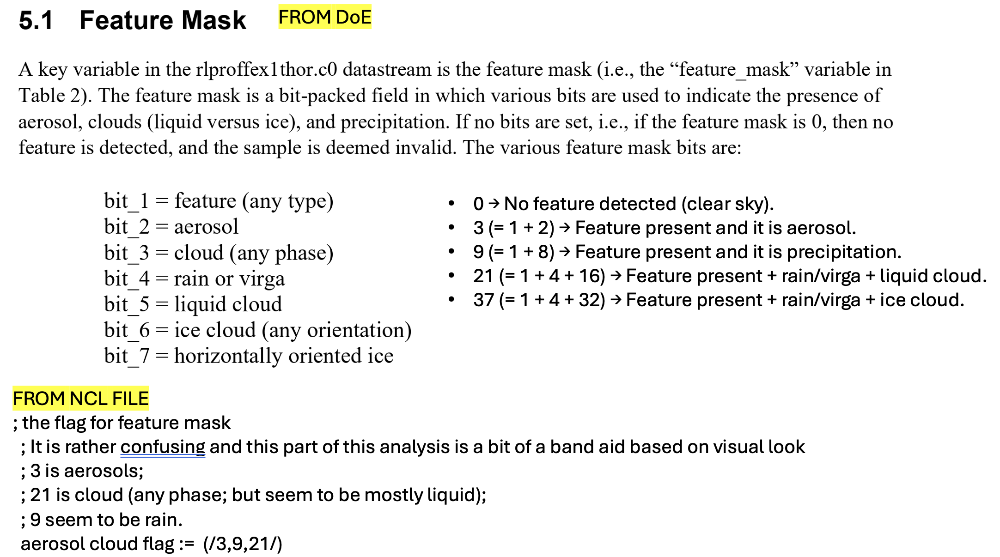

### feature_mask configration

In [3]:
# ==================== configuration ====================
var_name = "feature_mask"
hcoord   = "height_high"
month    = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

# classes for feature_mask
classes = np.array([0, 3, 9, 21, 37], dtype=float)
classes.sort()

# 连续边界（按相邻类别的中点构造）
mid = (classes[:-1] + classes[1:]) / 2.0
bounds = np.concatenate((
    [classes[0] - (classes[1] - classes[0]) / 2.0],
    mid,
    [classes[-1] + (classes[-1] - classes[-2]) / 2.0]
))

# 颜色：与你原先一致
cmap = ListedColormap(['#FFFFFF', '#7F0400', '#EFFF10', '#0F008F', '#7b2cbf'])
# 注意：clip=True 会把超出最大边界的值映射到最后一个颜色
norm = BoundaryNorm(bounds, cmap.N, clip=True)

# ==================== helper function ====================
def edges_from_centers(x):
    x = np.asarray(x, dtype=float)
    if x.size == 0:
        return np.array([0.0, 1.0], dtype=float)
    if x.size == 1:
        dx = 0.5
        return np.array([x[0] - dx, x[0] + dx], dtype=float)
    dx = np.diff(x)
    return np.concatenate(([x[0] - dx[0] / 2.0],
                           (x[:-1] + x[1:]) / 2.0,
                           [x[-1] + dx[-1] / 2.0]))

# ==================== select height and month ====================
# 这里假设 ds_a 已经在外部加载好了（包含 feature_mask 和 height_high）
ds_mon = ds_a.sel({hcoord: slice(hmin_km, hmax_km)}).sel(
    time=slice(f"{month}-01", f"{month}-28T23:59:59")
)
da = ds_mon[var_name]  # DataArray with dims (time, height_high)

# —— 若要排除 37（或其他不需要的类），取消下面一行的注释：
# da = da.where(np.isin(da, [0, 3, 9, 21]))

# days in the month
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

### feature_mask plot

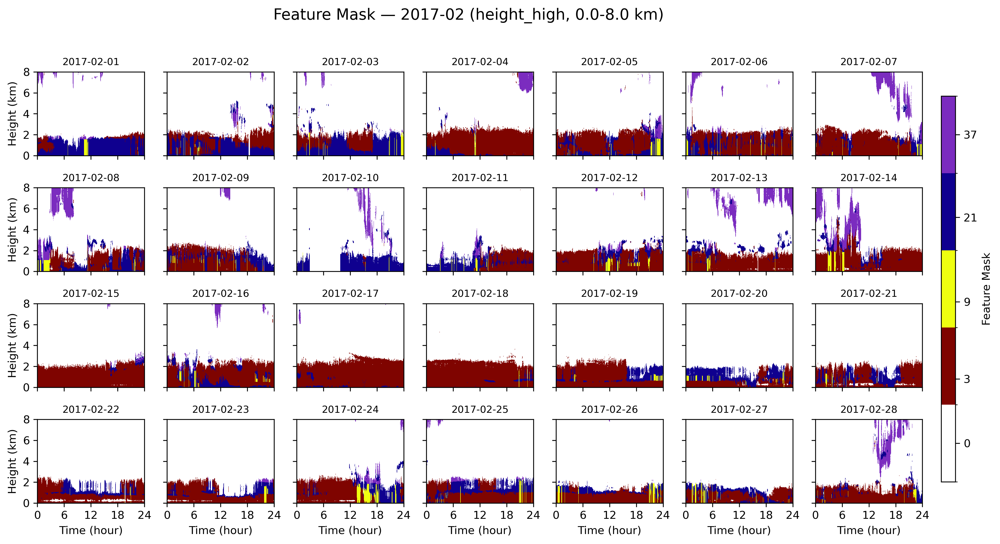

In [4]:
# ==================== plot ====================
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

last_img = None
for i, day in enumerate(days):
    ax = axes[i]
    da_day = da.sel(time=slice(str(day.date()), f"{day.date()}T23:59:59"))

    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    # X: 小时
    t_idx  = pd.DatetimeIndex(pd.to_datetime(da_day.time.values))
    hours  = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = edges_from_centers(hours)

    # Y: 高度 (km)
    zvals   = da_day.coords[hcoord].values
    y_edges = edges_from_centers(zvals)

    # Z: (height, time)
    Z = da_day.transpose("time", hcoord).values.T

    img = ax.pcolormesh(x_edges, y_edges, Z, cmap=cmap, norm=norm,
                        shading='auto', rasterized=True)
    last_img = img

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)
    ax.set_xticks(np.arange(0, 25, 6))
    ax.set_yticks(np.arange(int(hmin_km), int(hmax_km) + 1, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    if i // 7 == 3:
        ax.set_xlabel("Time (hour)")

# colorbar
if last_img is not None:
    cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  # 右侧独立色标轴
    cbar = plt.colorbar(last_img, cax=cax, ticks=classes)
    cbar.set_label("Feature Mask")
    cbar.ax.tick_params(length=4, width=0.8)

fig.suptitle(f"Feature Mask — {month} (height_high, {hmin_km}-{hmax_km} km)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


# Dust Fraction / Dust and Non-Dust Extinction / AOD / Dust AOD

Varible for calculate Dust Fraction:
- feature_mask
- depolarization_ratio
- extinction_be
- scattering_ratio_e

In [5]:
# =====month and height=======
month = "2017-02"
hmin_km, hmax_km = 0.03, 8.0

ds_mon = ds_a.sel(
    height_high=slice(hmin_km, hmax_km),
    time=slice(f"{month}-01", f"{month}-28T23:59:59")
)

# parameter
valid_classes = [3, 9, 21, 37]   
aerosol_class = 3
cloud_class = 21

dep_m  = 0.0049
dep_d  = 0.31
dep_nd = 0.15
T_K_WARM = 273.15

# ====================== QC ======================
mask_qc = (ds_mon["detection_confidence_score_total"] >= 0.3) & (ds_mon["qc_profile"] == 0)

feature_mask = ds_mon["feature_mask"].where(mask_qc)
pdr_meas     = ds_mon["depolarization_ratio"].where(mask_qc)
ext          = ds_mon["extinction_be"].where(mask_qc)
sca          = ds_mon["scattering_ratio_e"].where(mask_qc)
temp_qc      = ds_mon["temperature"].where(mask_qc)

# ====================== keep valid class ======================
mask_class = xr.zeros_like(feature_mask, dtype=bool)
for val in valid_classes:
    mask_class = mask_class | (feature_mask == val)

feature_mask = feature_mask.where(mask_class)
pdr_meas     = pdr_meas.where(mask_class)
ext          = ext.where(mask_class)
sca          = sca.where(mask_class)
temp_qc      = temp_qc.where(mask_class)  

# ====================== height limitation > 30 m ======================
mask_height = (ds_mon["height_high"] >= hmin_km) & (ds_mon["height_high"] <= hmax_km)
feature_mask = feature_mask.where(mask_height)
pdr_meas     = pdr_meas.where(mask_height)
ext          = ext.where(mask_height)
sca          = sca.where(mask_height)
temp_qc      = temp_qc.where(mask_height)

# ====================== aerosol-only mask ======================
aerosol_mask = feature_mask == aerosol_class
pdr_meas_aerosol = pdr_meas.where(aerosol_mask)
sca_aerosol      = sca.where(aerosol_mask)
ext_aerosol      = ext.where(aerosol_mask)

# ====================== cloud-only mask and cloud extinction ======================
cloud_mask_warm = (feature_mask == cloud_class) & (temp_qc >= T_K_WARM)
ext_cloud = ext.where(cloud_mask_warm)                 
ext_cloud = ext_cloud.where(ext_cloud > 0)                  

# ====================== calculate PDR ======================
tepo = sca_aerosol + (sca_aerosol * dep_m) - dep_m
xnum = tepo * pdr_meas_aerosol - dep_m
xden = sca_aerosol - 1 + (sca_aerosol * dep_m) - pdr_meas_aerosol
pdr = xnum / xden

# ====================== calculate dust fraction ======================
dust_frac = ((pdr - dep_nd) * (1 + dep_d)) / ((dep_d - dep_nd) * (1 + pdr))
dust_frac = dust_frac.where(pdr < dep_d, 1.0)
dust_frac = dust_frac.where(pdr > dep_nd, 0.0)
dust_frac = dust_frac.where(aerosol_mask)

# ====================== dust / non-dust extinction ======================
ext_dust    = (dust_frac * ext_aerosol).where(lambda v: v > 0)      
ext_nondust = ((1 - dust_frac) * ext_aerosol).where(lambda v: v > 0)

# ====================== column AOD / COD ======================

ext_units = (ext.attrs.get("units","") or "").replace(" ","").lower()
if any(u in ext_units for u in ["m-1", "1/m", "m^-1", "/m"]):
    z_int = ds_mon["height_high"] * 1000.0   # m
else:
    z_int = ds_mon["height_high"]            # km

dz  = xr.concat([z_int.isel(height_high=0), z_int.diff("height_high")], dim="height_high")
dz2d = xr.DataArray(dz, dims=["height_high"], coords={"height_high": ds_mon["height_high"]}).broadcast_like(ext)

ext_aero = ext.where(aerosol_mask)
AOD         = (ext_aero.clip(min=0) * dz2d).sum(dim="height_high")
dust_AOD    = (ext_dust * dz2d).sum(dim="height_high")
nondust_AOD = (ext_nondust * dz2d).sum(dim="height_high")

COD = (ext_cloud * dz2d).sum(dim="height_high")



### Dust fraction plot
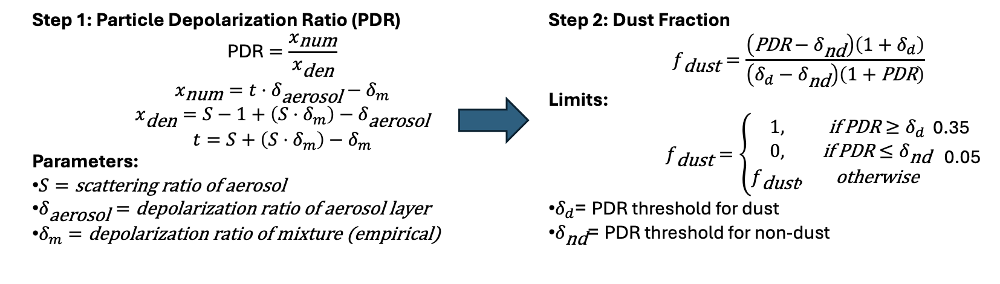

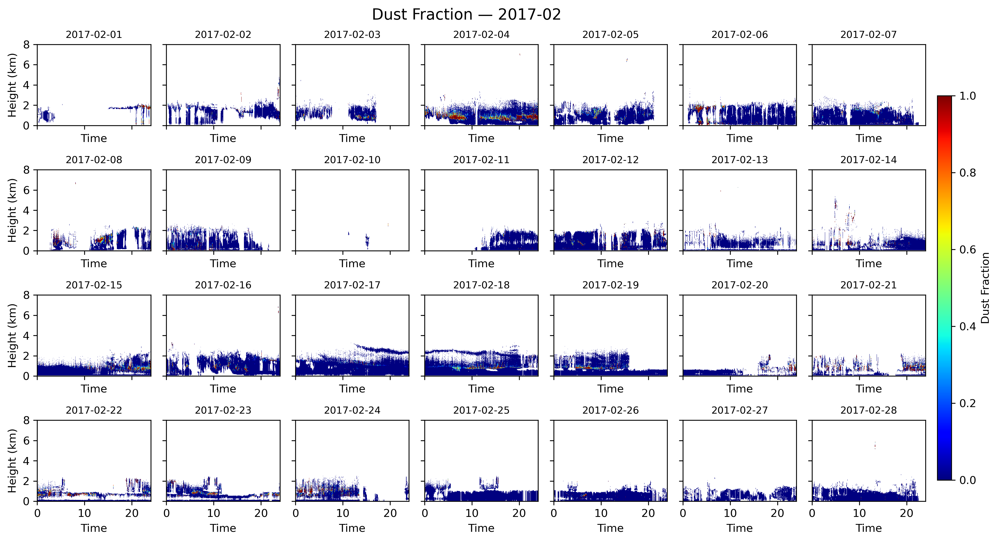

In [6]:
# ====== parameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = dust_frac[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, [height[-1] + (height[-1]-height[-2])/2]))

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = dust_frac.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, [hours[-1] + (hours[-1]-hours[-2])/2]))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="jet", vmin=0, vmax=1, shading="auto")  # 连续色条
    ax.set_title(day.strftime("%m-%d"), fontsize=8)
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)
# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax)
cbar.set_label("Dust Fraction")
plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust Fraction — {month}", fontsize=14)
plt.show()


#### Linear depolarization ratio

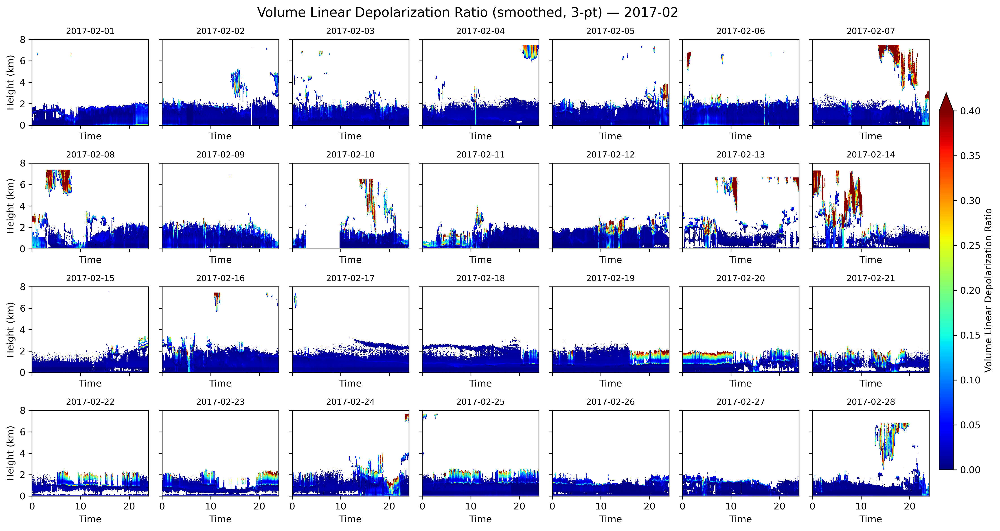

In [7]:
vldr = ds_mon["depolarization_ratio"].where(mask_qc).where(mask_height)
vldr = vldr.where(mask_class)
vldr_s = vldr.rolling(time=3, center=True, min_periods=1).mean()

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

height = vldr_s[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges,
                          [height[-1] + (height[-1]-height[-2])/2]))

vmax_vldr = np.nanpercentile(vldr_s.values, 99)
if not np.isfinite(vmax_vldr) or vmax_vldr <= 0:
    vmax_vldr = 0.4
vmin_vldr = 0.0

fig, axes = plt.subplots(4, 7, figsize=(14, 8), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    t0 = pd.Timestamp(day)
    t1 = t0 + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    da_day = vldr_s.sel(time=slice(str(t0), str(t1)))
    if da_day.time.size < 2:
        ax.set_visible(False)
        continue

    t_idx = pd.DatetimeIndex(pd.to_datetime(da_day.time.values))
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges,
                              [hours[-1] + (hours[-1]-hours[-2])/2]))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="jet",
                        shading="auto", vmin=0, vmax=0.4)

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# colorbar
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])
cbar = fig.colorbar(img, cax=cax, extend='max')
cbar.set_label("Volume Linear Depolarization Ratio")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Volume Linear Depolarization Ratio (smoothed, 3-pt) — {month}", fontsize=14)
plt.show()

### Total extinction, Dust and non-Dust extinction
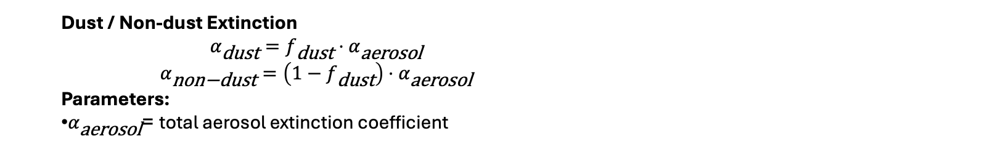

#### Total Extinction

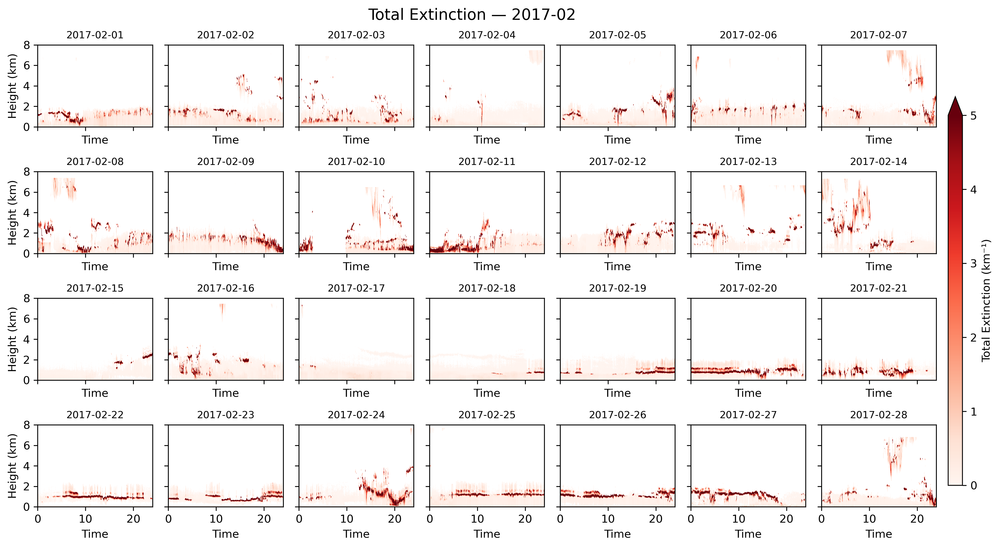

In [8]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext[hcoord].values  # 使用总 extinction
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate((
    [height[0] - (height[1]-height[0])/2],
    z_edges,
    [height[-1] + (height[-1]-height[-2])/2]
))

# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate((
        [hours[0] - (hours[1]-hours[0])/2],
        x_edges,
        [hours[-1] + (hours[-1]-hours[-2])/2]
    ))

    # 绘制总 extinction
    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(
        x_edges, z_edges, Z,
        cmap="Reds", shading="auto",
        vmin=0, vmax=5  # 
    )
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 1, 2, 3, 4 , 5,])
cbar.set_label("Total Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Total Extinction — {month}", fontsize=14)
plt.show()



#### Dust Extinction

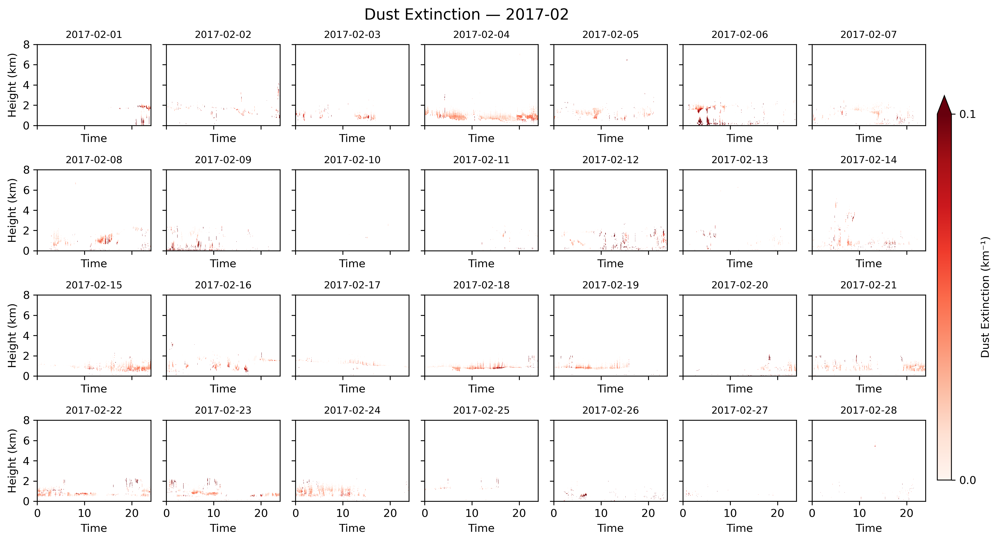

In [9]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext_dust[hcoord].values  # 使用 dust extinction
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, 
                          [height[-1] + (height[-1]-height[-2])/2]))

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext_dust.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    # 横轴小时
    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, 
                              [hours[-1] + (hours[-1]-hours[-2])/2]))


    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="Reds", shading="auto", vmin=0, vmax=0.1)  # 连续色条
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 0.1,])
cbar.set_label("Dust Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust Extinction — {month}", fontsize=14)
plt.show()


#### Non-Dust Extinction

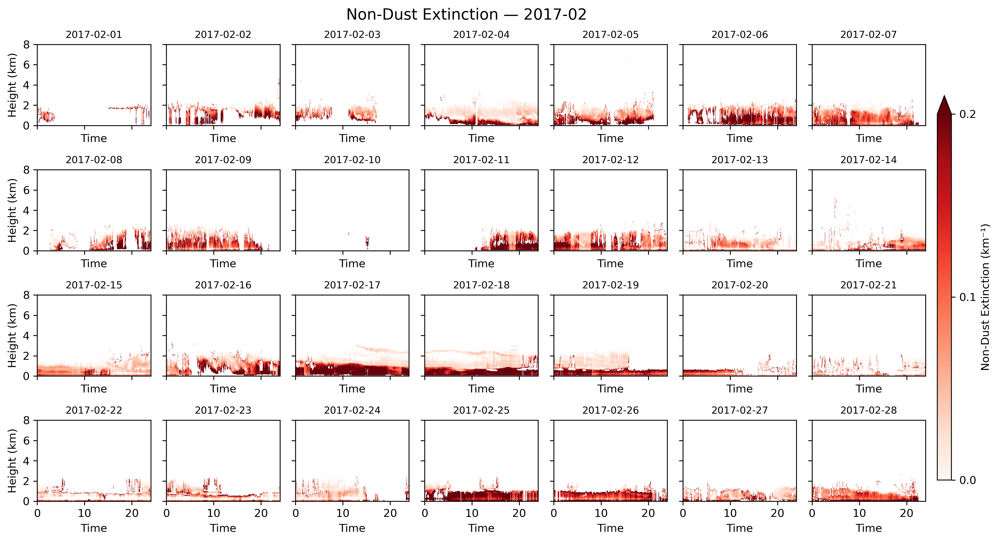

In [10]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext_nondust[hcoord].values  
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, 
                          [height[-1] + (height[-1]-height[-2])/2]))

# ====== PLot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext_nondust.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue


    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, 
                              [hours[-1] + (hours[-1]-hours[-2])/2]))

    # non-dust extinction
    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="Reds", shading="auto", vmin=0, vmax=0.2)  # 连续色条
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 0.1, 0.2,])
cbar.set_label("Non-Dust Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Non-Dust Extinction — {month}", fontsize=14)
plt.show()


### AOD and Dust AOD
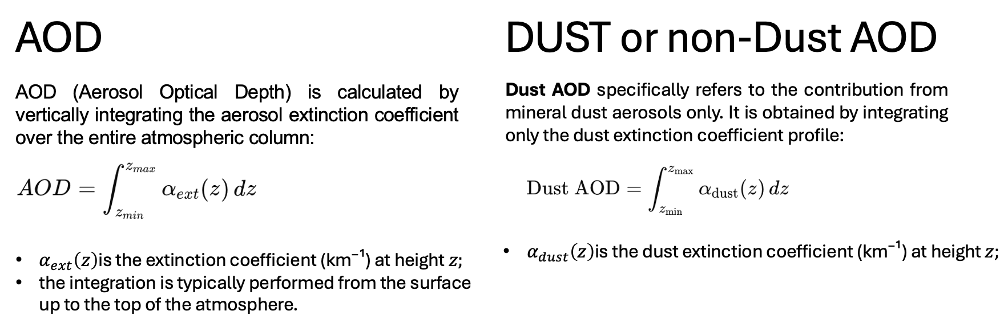

#### AOD

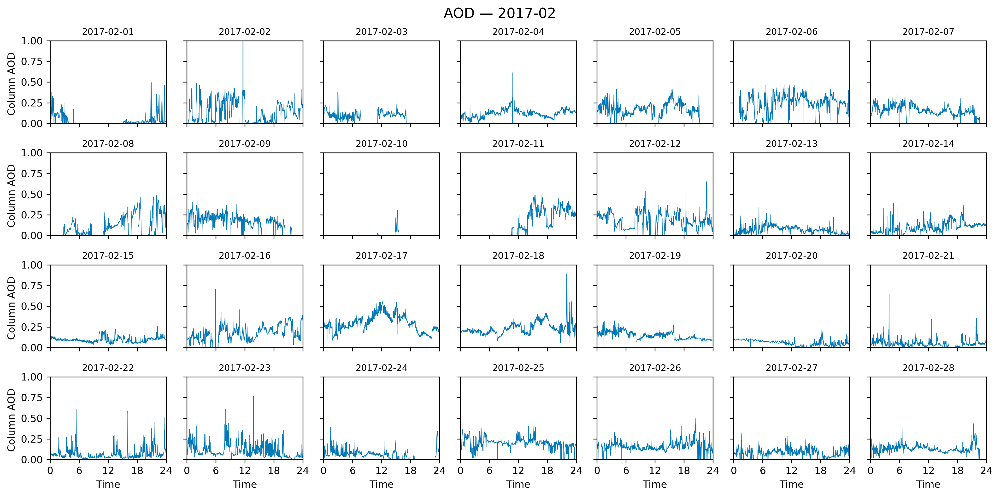

In [11]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)

    ax.set_ylim(0, 1)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"AOD — {month}", fontsize=14)
plt.show()


#### Dust AOD

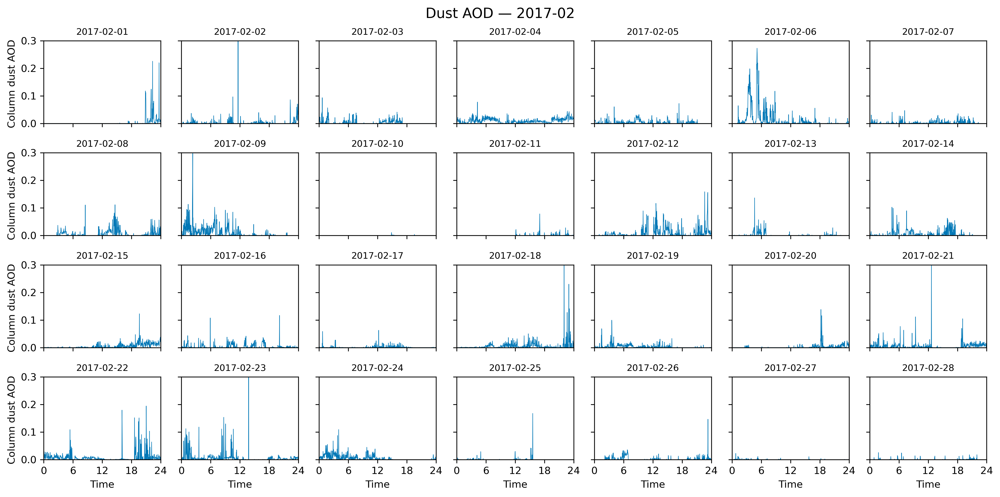

In [12]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = dust_AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 0.3)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column dust AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust AOD — {month}", fontsize=14)
plt.show()

#### non-Dust AOD

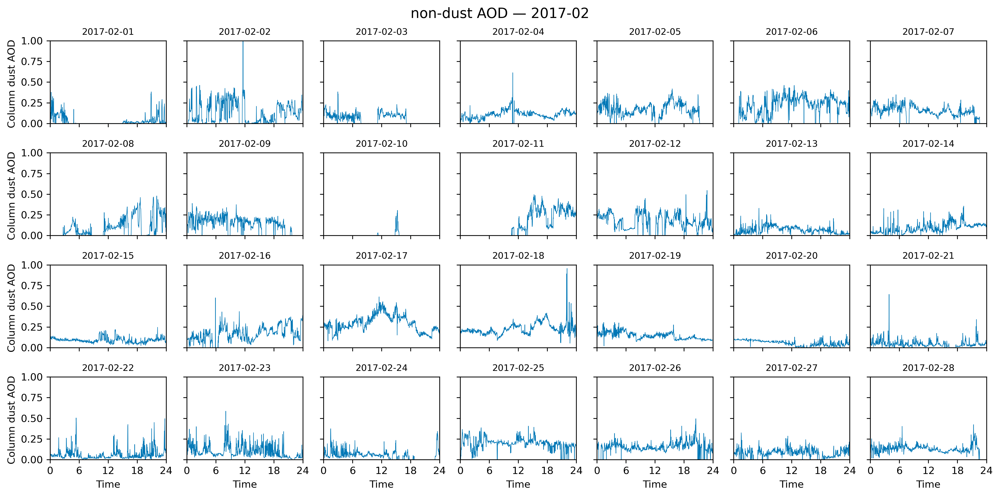

In [13]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = nondust_AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column dust AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"non-dust AOD — {month}", fontsize=14)
plt.show()

# Cloud related variables

In [14]:
ds_c = xr.open_mfdataset('/data/shared_data/ARM_data/ENA/enamwrret2turnC1/enamwrret2turnC1.c1.201702*.nc')

In [15]:
month = "2017-02"
ds_mon = ds_c.sel(time=slice(f"{month}-01", f"{month}-28T23:59:59"))

#### Liquid Water Path

In [16]:
lwp = ds_mon["phys_lwp"]        
qc  = ds_mon["qc_phys_lwp"]   

lwp_qc = lwp.where(qc == 0)
lwp_s = lwp_qc.rolling(time=3, center=True, min_periods=1).mean()

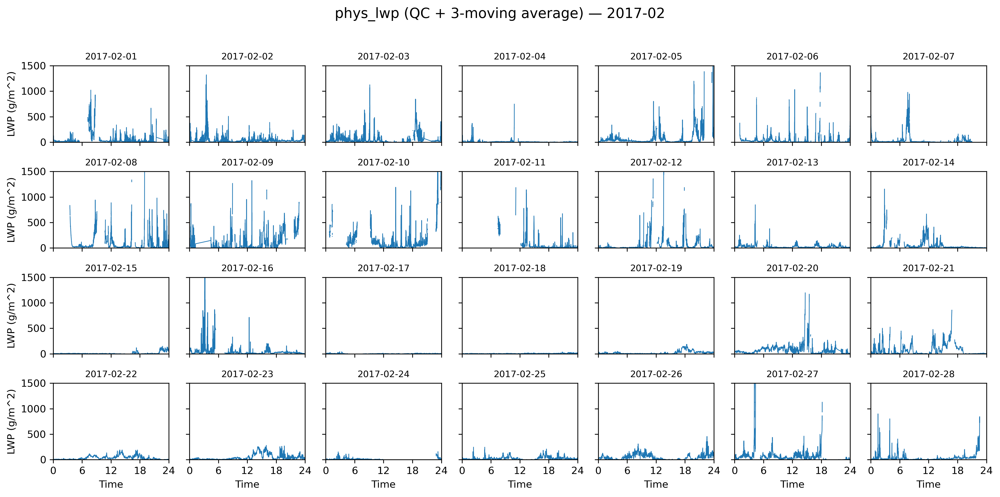

In [17]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    t0 = pd.Timestamp(day)
    t1 = t0 + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    lwp_day = lwp_s.sel(time=slice(str(t0), str(t1)))

    if lwp_day.time.size == 0:
        ax.set_visible(False)
        continue

    t_idx = pd.DatetimeIndex(lwp_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, lwp_day.values, lw=0.7)

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 1500)
    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel(f"LWP ({lwp_s.attrs.get('units','')})")
    if i // 7 == 3:
        ax.set_xlabel("Time")

fig.suptitle(f"phys_lwp (QC + 3-moving average) — {month}", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

#### Cloud Extinction

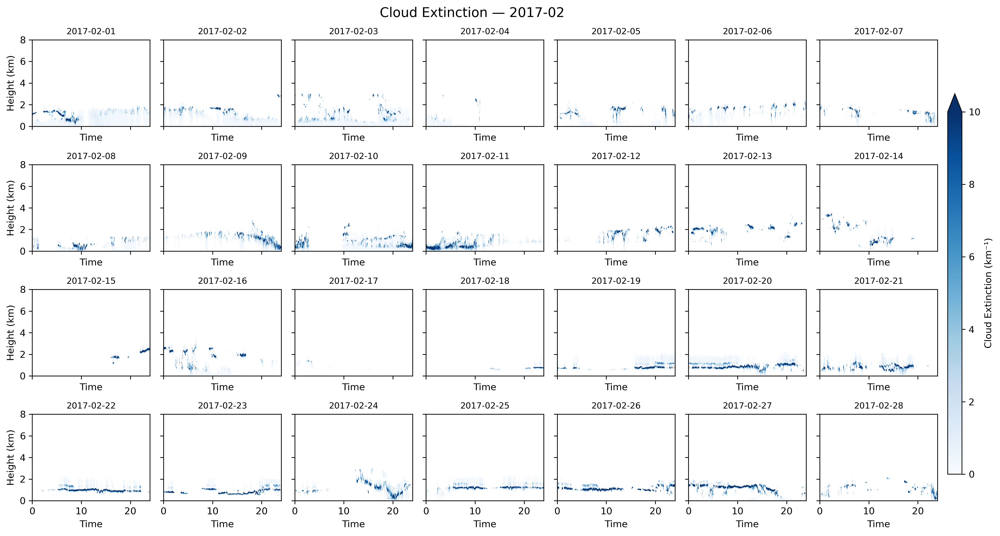

In [18]:
# ====== parameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

height = ext_cloud[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate((
    [height[0] - (height[1]-height[0])/2],
    z_edges,
    [height[-1] + (height[-1]-height[-2])/2]
))

vmax_cloud = np.nanpercentile(ext_cloud.values, 99)
if not np.isfinite(vmax_cloud) or vmax_cloud <= 0:
    vmax_cloud = 1.0  
vmin_cloud = 0.0

# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 8), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    day_start = pd.Timestamp(day)
    day_end   = day_start + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    da_day = ext_cloud.sel(time=slice(str(day_start), str(day_end)))

    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t_idx  = pd.DatetimeIndex(pd.to_datetime(da_day.time.values))
    hours  = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    if hours.size < 2:
        ax.set_visible(False)
        continue
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate((
        [hours[0] - (hours[1]-hours[0])/2],
        x_edges,
        [hours[-1] + (hours[-1]-hours[-2])/2]
    ))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(
        x_edges, z_edges, Z,
        cmap="Blues", shading="auto",
        vmin=0, vmax=10)

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])
cbar = fig.colorbar(img, cax=cax, extend='max')
cbar.set_label("Cloud Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Cloud Extinction — {month}", fontsize=14)
plt.show()


#### COD

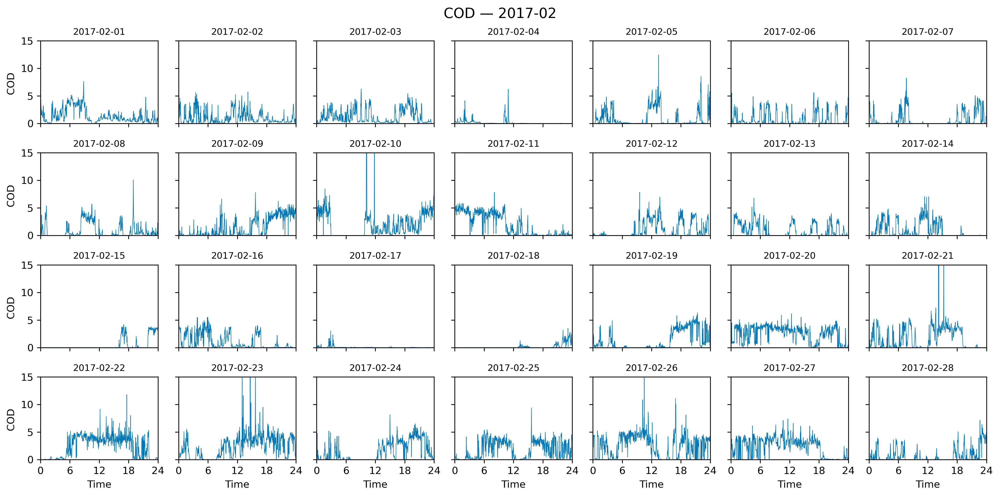

In [19]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = COD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 15)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("COD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"COD — {month}", fontsize=14)
plt.show()

#### Dust Vertical Distribution

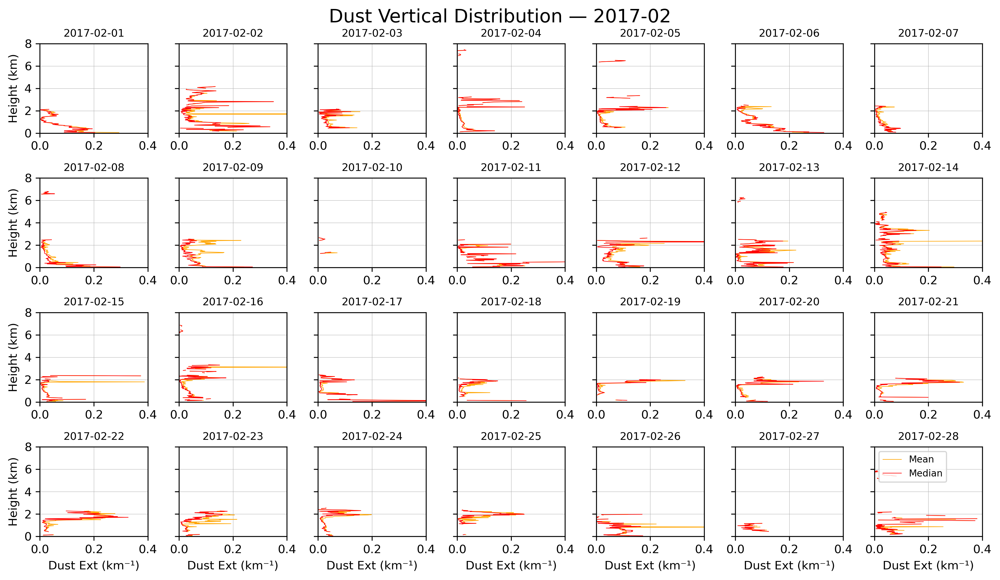

In [20]:
# ====== parameters ======
month = "2017-02"
hcoord = "height_high"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext_dust[hcoord].values  

# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    da_day = ext_dust.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    dust_mean = da_day.mean(dim="time", skipna=True).values
    dust_median = da_day.median(dim="time", skipna=True).values


    ax.plot(dust_mean, height, color="orange", label="Mean", lw=0.5)
    ax.plot(dust_median, height, color="red", label="Median", lw=0.5)

    ax.set_xlim(0, 0.4)
    ax.set_ylim(0, 8)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    if i // 7 == 3:
        ax.set_xlabel("Dust Ext (km⁻¹)")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)
    ax.grid(True, lw=0.3)

axes[-1].legend(loc="upper left", fontsize=8)

plt.tight_layout()
fig.suptitle(f"Dust Vertical Distribution — {month}", fontsize=16)
plt.subplots_adjust(top=0.92)
plt.show()

# Dust and Cloud height/location

### Mean Aerosol Height (μ) and Aerosol Scale Height (H)

In [22]:
# ===================================================================
# =============== 主尘层识别 + 高度特征计算（dust_*） ================
# ===================================================================

# 高度坐标（km）
z = ds_mon["height_high"].values.astype(float)

# 相邻层厚（km），用于积分权重
dz_km = np.empty_like(z, dtype=float)
if len(z) < 2:
    raise ValueError("height_high 维度长度不足，无法计算 dz")
dz_km[0]  = (z[1] - z[0])
dz_km[1:] = np.diff(z)

# 只保留正的 dust extinction；NaN 保留为缺测
dust_ext = xr.where(ext_dust > 0, ext_dust, np.nan)
dust_mask_arr = xr.where(ext_dust > 0, True, False).fillna(False).values  # (time, height)
dust_ext_arr  = dust_ext.values                                           # (time, height)

T, H = dust_mask_arr.shape

base_km  = np.full(T, np.nan, dtype=float)  # dust_base_height
top_km   = np.full(T, np.nan, dtype=float)  # dust_top_height
mean_km  = np.full(T, np.nan, dtype=float)  # dust_mean_height = (base+top)/2
scale_km = np.full(T, np.nan, dtype=float)  # dust_scale_height (e-fold above base)
cent_km  = np.full(T, np.nan, dtype=float)  # dust_centroid_height (ext-weighted)

for t in range(T):
    m = dust_mask_arr[t]   # bool profile
    e = dust_ext_arr[t]    # dust extinction profile

    if not np.any(m):
        continue

    # ---- 找到所有连续 True 的尘层段 ----
    mm = m.astype(int)
    edges  = np.diff(np.concatenate(([0], mm, [0])))
    starts = np.where(edges == 1)[0]
    ends   = np.where(edges == -1)[0] - 1  # inclusive

    if starts.size == 0:
        continue

    # ---- 选“主尘层”：层内 dust AOD（∑ ext_dust * dz_km）最大的段 ----
    best_idx = None
    best_int = -np.inf
    for s, eidx in zip(starts, ends):
        layer_ext = dust_ext_arr[t, s:eidx+1]
        layer_dz  = dz_km[s:eidx+1]
        integ = np.nansum(layer_ext * layer_dz)
        if np.isfinite(integ) and (integ > best_int):
            best_int = integ
            best_idx = (s, eidx)

    if best_idx is None:
        continue

    s, eidx = best_idx
    base_km[t] = z[s]
    top_km[t]  = z[eidx]
    mean_km[t] = 0.5 * (base_km[t] + top_km[t])

    # ---- 质心（主尘层内的 dust extinction 加权）: ∫z*ext*dz / ∫ext*dz ----
    layer_ext = dust_ext_arr[t, s:eidx+1]
    layer_z   = z[s:eidx+1]
    layer_dz  = dz_km[s:eidx+1]

    m_valid = np.isfinite(layer_ext) & (layer_ext > 0)
    if np.count_nonzero(m_valid) > 0:
        num = np.nansum(layer_ext[m_valid] * layer_z[m_valid] * layer_dz[m_valid])
        den = np.nansum(layer_ext[m_valid] *                 layer_dz[m_valid])
        if den > 0 and np.isfinite(num):
            cent_km[t] = num / den

    # ---- 尺度高度：自层底 ext0 衰减到 ext0/e 的高度差（log 空间线性插值）----
    # 取层底第一个有效正值作为 ext0
    valid0 = np.where(np.isfinite(layer_ext) & (layer_ext > 0))[0]
    if valid0.size == 0:
        continue

    s0 = valid0[0]
    ext0 = layer_ext[s0]
    target = ext0 / np.e
    eps = 1e-12
    found = False

    for k in range(s0, len(layer_ext) - 1):
        y1, y2 = layer_ext[k], layer_ext[k+1]
        if not (np.isfinite(y1) and np.isfinite(y2) and y1 > eps and y2 > eps):
            continue
        # 目标值跨越
        if (y1 >= target and y2 <= target) or (y1 <= target and y2 >= target):
            z1, z2   = layer_z[k], layer_z[k+1]
            ly1, ly2 = np.log(y1), np.log(y2)
            ltar     = np.log(target)
            frac = (ltar - ly1) / (ly2 - ly1) if ly2 != ly1 else 0.0
            z_star = z1 + frac * (z2 - z1)
            scale_km[t] = z_star - layer_z[s0]
            found = True
            break

    if not found:
        # 若未降到 1/e，回退端点近似：H ≈ Δz / ln(ext0 / ext_top)
        y_top = layer_ext[-1]
        if np.isfinite(y_top) and y_top > eps and ext0 > eps and (ext0 / y_top) > 1.0:
            scale_km[t] = (layer_z[-1] - layer_z[s0]) / np.log(ext0 / y_top)
        else:
            scale_km[t] = np.nan

# ====================== 打包结果 ======================
time_coord = ds_mon["time"]
dust_heights = xr.Dataset(
    data_vars=dict(
        dust_base_height = xr.DataArray(base_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust layer base height (main dust layer)"}),
        dust_top_height  = xr.DataArray(top_km,  coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust layer top height (main dust layer)"}),
        dust_mean_height = xr.DataArray(mean_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Mean dust height μ=(base+top)/2 (main dust layer)"}),
        dust_scale_height= xr.DataArray(scale_km,coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust scale height H (e-fold above base, main dust layer)"}),
        dust_centroid_height = xr.DataArray(cent_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust extinction-weighted centroid height (main dust layer)"}),
    )
)

# （可选）附加层厚 ΔZ
dust_heights["dust_layer_thickness"] = (
    dust_heights["dust_top_height"] - dust_heights["dust_base_height"]
)
dust_heights["dust_layer_thickness"].attrs.update(
    {"units":"km","long_name":"Dust layer thickness ΔZ"}
)

KeyError: "No variable named 'height_high'. Variables on the dataset include ['base_time', 'time_offset', 'phys_pwv', 'qc_phys_pwv', 'phys_pwv_uncertainty', ..., 'lat', 'lon', 'alt', 'time', 'freq']"

In [ ]:
dust_mean = dust_heights["dust_mean_height"].values
dust_mean = dust_mean[np.isfinite(dust_mean)]

dust_cent = dust_heights["dust_centroid_height"].values
dust_cent = dust_cent[np.isfinite(dust_cent)]

bins = np.linspace(0, 5, 40)

fig, ax = plt.subplots(figsize=(6,3), dpi=150)


ax.hist(dust_mean, bins=bins, density=True, orientation="horizontal",
        alpha=0.5, label="Dust mean height", edgecolor="k")
ax.hist(dust_cent, bins=bins, density=True, orientation="horizontal",
        alpha=0.5, label="Dust centroid height", edgecolor="k")

ax.set_ylabel("Height (km)")
ax.set_xlabel("Probability density")
ax.set_ylim(0, 5)
ax.set_title("Probability distribution of dust heights (PDF vs. height)")
ax.legend()
ax.grid(alpha=0.3, ls='--')

plt.tight_layout()
plt.show()



### Cloud height / Geometric Thickness / Droplet Effective Radius (Re)

In [ ]:
ds_cloud_height = xr.open_mfdataset('/data/shared_data/ARM_data/ENA/others/enaarsclkazrbnd1kolliasC1/enaarsclkazrbnd1kolliasC1.c0.201702*.nc')

In [ ]:
import numpy as np
import xarray as xr

clb_km = ds_cloud_height["cloud_layer_base_height"] / 1000.0
clt_km = ds_cloud_height["cloud_layer_top_height"]  / 1000.0

# 有效层
valid_layer = (
    np.isfinite(clb_km) & np.isfinite(clt_km) &
    (clb_km >= 0) & (clt_km >= 0)
)

# 每个时刻有效层数
n_layers = valid_layer.sum(dim="layer")

# 对所有 time 都计算唯一层索引；若不是单层云 → 设 NaN
sel_idx = valid_layer.astype(int).argmax(dim="layer")  # 先拿个索引
sel_idx = sel_idx.where(n_layers == 1)  # 非单层 → NaN

# apply_ufunc 时处理 NaN 索引
def take_by_idx(arr_1d, idx_scalar):
    if np.isnan(idx_scalar):
        return np.nan
    return arr_1d[int(idx_scalar)]

sub_clb = clb_km
sub_clt = clt_km

clb_1 = xr.apply_ufunc(
    take_by_idx,
    sub_clb,
    sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[sub_clb.dtype],
).rename("cloud_base_height")

clt_1 = xr.apply_ufunc(
    take_by_idx,
    sub_clt,
    sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[sub_clt.dtype],
).rename("cloud_top_height")

# 派生量（km）
cloud_thickness = (clt_1 - clb_1).rename("cloud_geometric_thickness")
cloud_mean_h    = (clt_1 + clb_1) * 0.5
cloud_mean_h    = cloud_mean_h.rename("cloud_mean_height")

cloud_heights = xr.Dataset(
    {
        "cloud_base_height": clb_1,
        "cloud_top_height": clt_1,
        "cloud_geometric_thickness": cloud_thickness,
        "cloud_mean_height": cloud_mean_h,
    }
)


In [ ]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# 取出 cloud_mean_height（单位：km），并确保按时间排序
cmh = cloud_heights["cloud_mean_height"].sortby("time")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    # 当天的起止时间
    t0 = pd.Timestamp(day)
    t1 = pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    cmh_day = cmh.sel(time=slice(str(t0), str(t1)))

    # 若当日无数据，则隐藏该子图
    if cmh_day.time.size == 0:
        ax.set_visible(False)
        continue

    # 转为小时轴
    t_idx = pd.DatetimeIndex(cmh_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    # 只画有效值（NaN 代表晴空/多层云被保留）
    y = cmh_day.values
    m = np.isfinite(y)
    if np.any(m):
        ax.plot(hours[m], y[m], lw=0.6)  # 颜色可按需改

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 15)   # 高度范围（km），可按需改成 0–5 或其他
    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Cloud m-heit (km)")
    if i // 7 == 3:
        ax.set_xlabel("Time")

fig.suptitle(f"Cloud mean height — {month}", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 提取数据，去掉 NaN
cloud_mh = cloud_heights["cloud_mean_height"].values
dust_mh  = dust_heights["dust_mean_height"].values

cloud_mh = cloud_mh[np.isfinite(cloud_mh)]
dust_mh  = dust_mh[np.isfinite(dust_mh)]

# 设置高度范围
ymin, ymax = 0, 12   # km
bins = np.linspace(ymin, ymax, 100)  # bin 可调，越大分辨率越细

# 计算直方图概率密度
cloud_counts, edges = np.histogram(cloud_mh, bins=bins, density=True)
dust_counts, _      = np.histogram(dust_mh,  bins=bins, density=True)

y_centers = 0.5 * (edges[:-1] + edges[1:])
bar_h     = np.diff(edges)

# ====== Plot ======
fig, ax = plt.subplots(figsize=(5, 8), dpi=300)

# 横坐标=PDF，纵坐标=高度
ax.barh(y_centers, cloud_counts, height=bar_h, alpha=0.5, label="Cloud mean height", color="#2e64fe", edgecolor=None)
ax.barh(y_centers, dust_counts,  height=bar_h, alpha=0.5, label="Dust mean height",  color="#df013a",  edgecolor=None)

ax.set_xlabel("Probability Density Function")
ax.set_ylabel("Height (km)")
ax.set_yticks(np.arange(0,13,1))
ax.set_ylim(ymin, ymax)
ax.legend()
ax.grid(axis="x", alpha=0.3)
ax.set_title("PDF of Cloud vs Dust Mean Height")

plt.tight_layout()
plt.show()


### Layer-mean Liquid Water Content (LWC): LWP divided by cloud thickness.
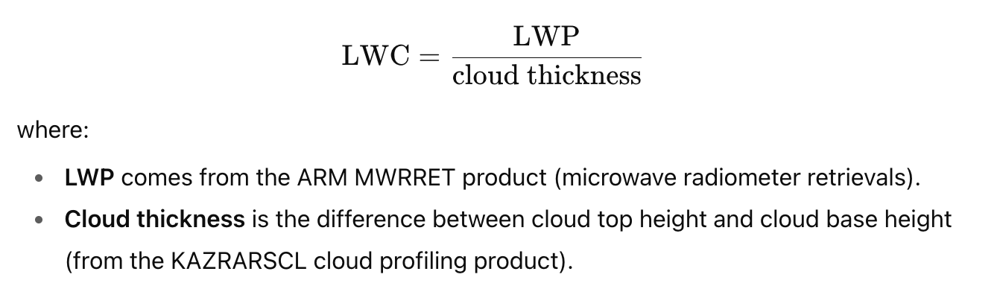



In [ ]:
import numpy as np
import xarray as xr

def compute_lwc_min_bias(cloud_heights, lwp_qc, tol_seconds=60.0,
                         min_thick_km=0.0, warm_only=False, cloud_temp=None):
    """
    最小方法学偏差的层平均 LWC：最近邻+容差；无插值；对不上=NaN；单层云之外为 NaN。
    """
    cmh_time = cloud_heights["time"]
    lwp_qc = lwp_qc.sortby("time")

    tol = np.timedelta64(int(tol_seconds), "s")
    lwp_on_cloud = lwp_qc.reindex(time=cmh_time, method="nearest", tolerance=tol)

    thick_km = cloud_heights["cloud_geometric_thickness"]  # km
    if min_thick_km > 0:
        thick_km = thick_km.where(thick_km > min_thick_km)
    thick_m = thick_km * 1000.0

    if warm_only and (cloud_temp is not None):
        warm_mask = (cloud_temp >= 273.15)
        lwp_on_cloud = lwp_on_cloud.where(warm_mask)
        thick_m      = thick_m.where(warm_mask)

    valid = np.isfinite(thick_m) & (thick_m > 0) & np.isfinite(lwp_on_cloud)
    lwc = xr.where(valid, lwp_on_cloud / thick_m, np.nan).rename("layer_mean_LWC")
    lwc.attrs.update({
        "long_name": "Layer-mean liquid water content",
        "units": "g m^-3",
        "method": f"Nearest-neighbor LWP within {int(tol_seconds)} s; no interpolation; single-layer only."
    })

    out = xr.Dataset(
        data_vars={
            "cloud_base_height":         cloud_heights.get("cloud_base_height"),
            "cloud_top_height":          cloud_heights.get("cloud_top_height"),
            "cloud_geometric_thickness": thick_km,
            "cloud_mean_height":         cloud_heights.get("cloud_mean_height"),
            "layer_mean_LWC":            lwc,
        },
        coords={"time": cmh_time}
    )
    return out


def compute_re_min_bias(cloud_heights, lwp_qc, cod, tol_seconds=60.0,
                        warm_only=False, cloud_temp=None, name="effective_radius"):
    """
    最小方法学偏差的云滴有效半径 Re（Han+1995）：
      - 共定位到 cloud_heights.time（单层云之外为 NaN）
      - 最近邻 + 严格容差（默认 60s）
      - 无插值；任一变量对不上 → NaN
      - 公式（LWP[g m^-2], COD 无量纲）：Re[μm] = 1.5 * LWP / COD
    """
    cmh_time = cloud_heights["time"]
    lwp_qc = lwp_qc.sortby("time")
    cod    = cod.sortby("time")

    tol = np.timedelta64(int(tol_seconds), "s")
    lwp_on_cloud = lwp_qc.reindex(time=cmh_time, method="nearest", tolerance=tol)  # g m^-2
    cod_on_cloud = cod.reindex(time=cmh_time,    method="nearest", tolerance=tol)  # unitless

    # 可选：只保留暖云
    if warm_only and (cloud_temp is not None):
        warm_mask = (cloud_temp >= 273.15)
        lwp_on_cloud = lwp_on_cloud.where(warm_mask)
        cod_on_cloud = cod_on_cloud.where(warm_mask)

    # 仅在 LWP 与 COD 都有效，且 COD>0 时计算
    valid = np.isfinite(lwp_on_cloud) & np.isfinite(cod_on_cloud) & (cod_on_cloud > 0)

    re_um = xr.where(valid, 1.5 * (lwp_on_cloud / cod_on_cloud), np.nan)
    re_um = re_um.rename(name)
    re_um.attrs.update({
        "long_name": "Cloud droplet effective radius",
        "units": "micrometer",
        "reference": "Han et al. (1995)",
        "method": f"Re = 1.5 * LWP(g m^-2) / COD, colocated by nearest within {int(tol_seconds)} s; no interpolation; single-layer time axis."
    })

    # 打包结果（与 cloud_heights 时间完全对齐）
    out = xr.Dataset(
        data_vars={
            name:                         re_um,
            "cloud_base_height":         cloud_heights.get("cloud_base_height"),
            "cloud_top_height":          cloud_heights.get("cloud_top_height"),
            "cloud_geometric_thickness": cloud_heights.get("cloud_geometric_thickness"),
            "cloud_mean_height":         cloud_heights.get("cloud_mean_height"),
        },
        coords={"time": cmh_time}
    )
    return out


# ===== 使用示例 =====
# 你已有：
# - cloud_heights（单层云：cloud_base_height, cloud_top_height, cloud_geometric_thickness, cloud_mean_height）
# - lwp_qc：通过 QC 的 LWP (g m^-2)
# - COD：你的列光学厚度时间序列 (unitless)
# - （可选）cloud_temp：云温度 (K)

# 1) 层平均 LWC（严格 60s）
cloud_with_lwc = compute_lwc_min_bias(
    cloud_heights=cloud_heights,
    lwp_qc=lwp_qc,
    tol_seconds=60.0,
    min_thick_km=0.0,     # 若要排除过薄云可改为 0.1
    warm_only=False,      # 若只做暖云，设 True 并传 cloud_temp
    cloud_temp=None
)

# 2) 有效半径 Re（严格 60s）
cloud_with_re = compute_re_min_bias(
    cloud_heights=cloud_heights,
    lwp_qc=lwp_qc,
    cod=COD,              # 你的 COD DataArray
    tol_seconds=60.0,
    warm_only=False,      # 若只做暖云，设 True 并传 cloud_temp
    cloud_temp=None,
    name="effective_radius"
)
